# Image analysis and pattern recognition - Final Project 

**Group ID:** 24

**Author 1 (341742):** Axel CEBILLE  
**Author 2 (345815):** Melissa RIESEN  
**Author 3 (347320):** Sophie MOSEGAARD  

**Challenge:** Classic


In [4]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from glob import glob
import pandas as pd
from collections import defaultdict
import itertools
import csv
import itertools
import sys
sys.path.append('.')


### Pipeline overview

The fist step in processing the data was to manually label the chocolates on the test images to generate References that could be accessed in downstream processes.  
We used a online tool, that allowed us to draw bounding boxes around the chocolates and label them. The results are stored in a csv file [ _annotations.csv ](data/_annotations.csv) with the following format:

filename,xmin,ymin,xmax,ymax,label

This step was also done for all other objects and strong background contours in the training images [ _annotations_objects.csv ](data/_annotations_objects.csv).


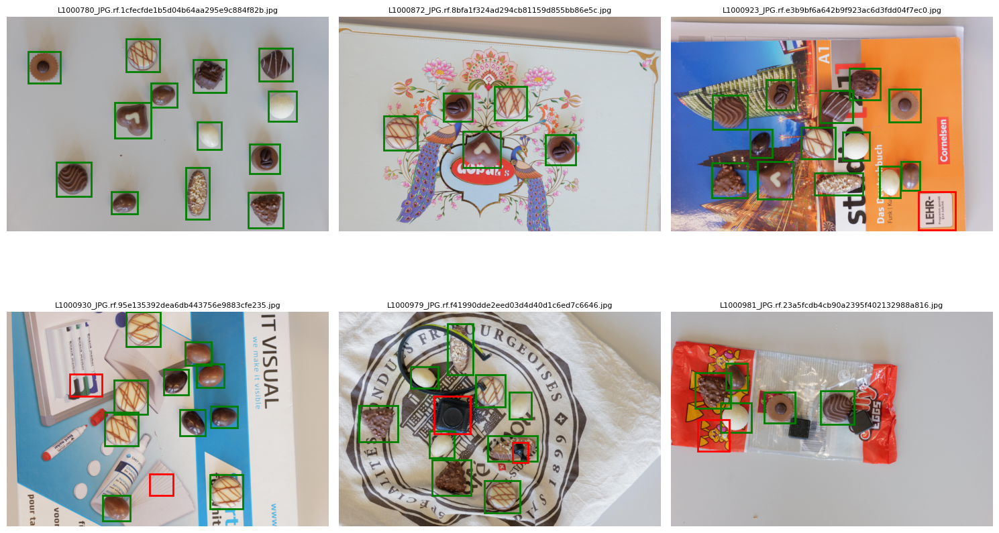

In [5]:
from visualizations import show_bounding_boxes

# Paths relative to the notebook location (src/)
visualize_img = os.path.abspath(os.path.join('..', 'images', 'report_visualization'))
annot_choc = os.path.abspath(os.path.join('data', '_annotations.csv'))          # replace with actual file names
annot_obj = os.path.abspath(os.path.join('data', '_annotations_objects.csv'))  # replace with actual file names

show_bounding_boxes(visualize_img, annot_choc, annot_obj)


The images are now quite complex. We tried to reduce the complexity caused by different colors by applying a K-mean clustering. For this we used the KMeans function from sklearn. To find the optimal k we visualized images with different values for k. 

**As the images present various backgrounds with more or less different colors, the best k is not the same for all images....**


In [6]:
def kmeans_clustering(image, k=4):
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(Z)
    labels = kmeans.labels_.reshape(image.shape[:2])
    clustered_img = kmeans.cluster_centers_[labels].reshape(image.shape).astype(np.uint8)
    return clustered_img, labels

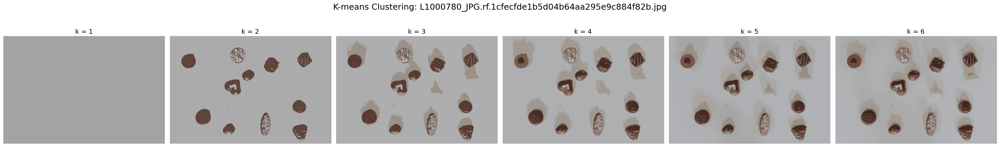

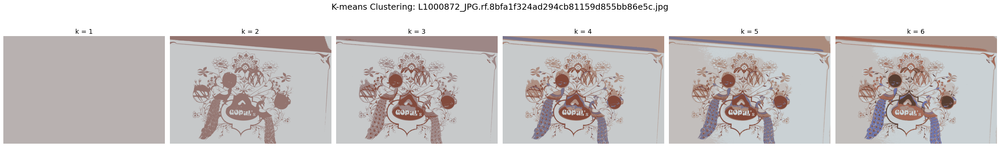

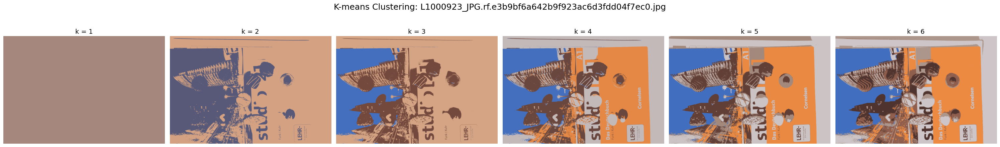

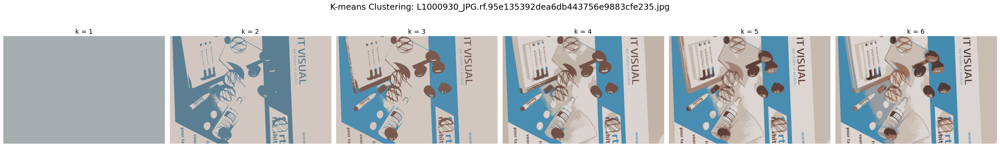

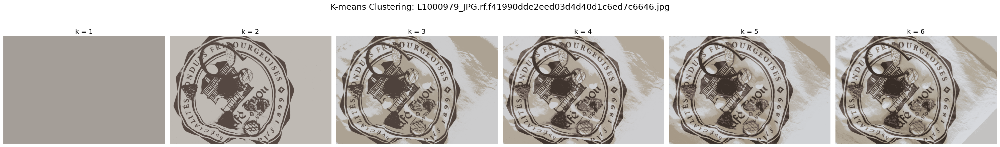

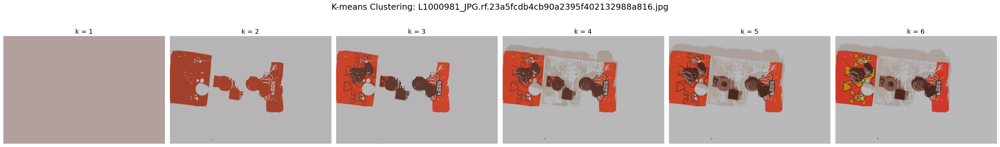

In [4]:
from visualizations import kmeans_comparisons
kmeans_comparisons(kmeans_clustering, visualize_img, 6)



In [4]:
def extract_class_masks(labels, num_classes=4):
    masks = []
    for i in range(num_classes):
        mask = np.uint8(labels == i) * 255
        masks.append(mask)
    return masks

def clean_mask(mask):
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))

    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel_close)
    
    # Optional: strengthen structure further
    dilated = cv2.dilate(closed, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)), iterations=1)
    return dilated

Only keep the contours that have the required size

In [5]:
def get_contours_from_mask(mask, min_area=1500, size_range=(350, 800)): #Change here 450 to 700
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = []
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        if (min_area < cv2.contourArea(c) and
            size_range[0] <= w <= size_range[1] and
            size_range[0] <= h <= size_range[1]):
            filtered.append(c)
    return filtered

Extract the histogram: We have 2 methods. 
* Directly from the computed contours
* From the annotation bounding boxes 
Here both from bounding boxes.


In [6]:
def extract_histogram(img, contour):
    x, y, w, h = cv2.boundingRect(contour)
    roi = img[y:y+h, x:x+w]
    hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def load_reference_histograms_from_contours(ref_folder):
    histograms = {}
    for path in glob(os.path.join(ref_folder, '*.jpg')):
        img = cv2.imread(path)
        clustered_img, labels = kmeans_clustering(img, k=4)
        masks = extract_class_masks(labels)
        for i, mask in enumerate(masks):
            cleaned = clean_mask(mask)
            contours = get_contours_from_mask(cleaned)
            if contours:
                hist = extract_histogram(img, contours[0])
                filename = os.path.basename(path)
                class_name = filename.split('_JPG')[0]
                histograms[class_name] = hist
                break
    return histograms

def load_reference_histograms_from_annotations(csv_path, train_folder):
    df = pd.read_csv(csv_path)

    # To store histograms per class
    histograms_by_class = defaultdict(list)

    for _, row in df.iterrows():
        filename = row['filename']
        img_path = os.path.join(train_folder, filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Failed to load image {img_path}")
            continue

        x_min, y_min, x_max, y_max = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        cls = row['class']

        # Crop region and extract histogram
        roi = img[y_min:y_max, x_min:x_max]
        if roi.size == 0:
            print(f"Warning: Empty ROI for {filename} {cls}")
            continue

        hist = cv2.calcHist([roi], [0, 1, 2], None, [8,8,8], [0,256,0,256,0,256])
        cv2.normalize(hist, hist)
        histograms_by_class[cls].append(hist.flatten())

    # Compute mean histogram per class
    mean_histograms = {}
    for cls, hist_list in histograms_by_class.items():
        mean_hist = np.mean(hist_list, axis=0)
        mean_histograms[cls] = mean_hist

    print(f"Computed histograms for {len(mean_histograms)} classes.")
    return mean_histograms


In [7]:
def match_histogram(hist, ref_chocolates, ref_objects):
    best_label = None
    best_score = -1

    # Compare to chocolate reference histograms
    for label, ref_hist in ref_chocolates.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'chocolate'

    # Compare to object reference histograms
    for label, ref_hist in ref_objects.items():
        score = cv2.compareHist(hist, ref_hist, cv2.HISTCMP_CORREL)
        if score > best_score:
            best_score = score
            best_label = label
            best_from = 'object'

    # Only return label if it matched a chocolate, not an object
    return best_label if best_from == 'chocolate' else None


In [8]:
def compute_overlap_ratio(box1, box2):
    # (x, y, w, h)
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert to x_min, y_min, x_max, y_max
    xa1, ya1, xa2, ya2 = x1, y1, x1 + w1, y1 + h1
    xb1, yb1, xb2, yb2 = x2, y2, x2 + w2, y2 + h2

    # Compute intersection
    xi1 = max(xa1, xb1)
    yi1 = max(ya1, yb1)
    xi2 = min(xa2, xb2)
    yi2 = min(ya2, yb2)

    iw = max(0, xi2 - xi1)
    ih = max(0, yi2 - yi1)
    inter_area = iw * ih

    area1 = w1 * h1
    area2 = w2 * h2
    overlap_ratio = inter_area / min(area1, area2) if min(area1, area2) > 0 else 0


    return overlap_ratio

def filter_overlapping_boxes(detections, overlap_thresh=0.1):
    keep = [True] * len(detections)

    for i, j in itertools.combinations(range(len(detections)), 2):
        if not keep[i] or not keep[j]:
            continue

        boxA = detections[i]['bbox']
        boxB = detections[j]['bbox']
        overlap = compute_overlap_ratio(boxA, boxB)

        if overlap >= overlap_thresh:
            # Compare scores
            if detections[i]['score'] >= detections[j]['score']:
                keep[j] = False
            else:
                keep[i] = False

    return [det for k, det in enumerate(detections) if keep[k]]




In [9]:
from visualizations import display_results

def process_image(img_path, reference_histograms, reference_histograms_objects, k=4, visualize=False, overlap=True):
    img = cv2.imread(img_path)
    clustered_img, labels = kmeans_clustering(img, k)
    class_masks = extract_class_masks(labels, k)

    all_contours = []
    all_labels = []
    choc_contours = []
    choc_labels = []
    no_over_choc_contours = []
    no_over_choc_labels = []

    chocolate_detections = []

    for mask in class_masks:
        cleaned = clean_mask(mask)
        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            roi = img[y:y+h, x:x+w]
            if roi.size == 0:
                continue

            hist = extract_histogram(img, cnt)
            best_label = match_histogram(hist, reference_histograms, reference_histograms_objects)
            
            all_contours.append(cnt)
            all_labels.append(best_label)

            if best_label:  # Assume non-empty label means chocolate
                choc_contours.append(cnt)
                choc_labels.append(best_label)

                score = cv2.compareHist(hist, reference_histograms[best_label], cv2.HISTCMP_CORREL)
                chocolate_detections.append({
                    'contour': cnt,
                    'label': best_label,
                    'score': score,
                    'bbox': (x, y, w, h)
                })

    # Overlap filtering on chocolate detections
    if overlap:
        filtered = filter_overlapping_boxes(chocolate_detections, overlap_thresh=0.1)
    else:
        filtered = chocolate_detections

    for d in filtered:
        no_over_choc_contours.append(d['contour'])
        no_over_choc_labels.append(d['label'])

    # Display
    if visualize:
        display_results(img, clustered_img, all_contours, all_labels, choc_contours, choc_labels, no_over_choc_contours, no_over_choc_labels)
    
    return no_over_choc_contours, no_over_choc_labels



In [11]:
total_train_img = os.path.abspath(os.path.join('..', 'images', 'train_total'))
ref_histograms = load_reference_histograms_from_annotations(annot_choc, total_train_img)
obj_histograms = load_reference_histograms_from_annotations(annot_obj, total_train_img)


Computed histograms for 13 classes.
Computed histograms for 34 classes.


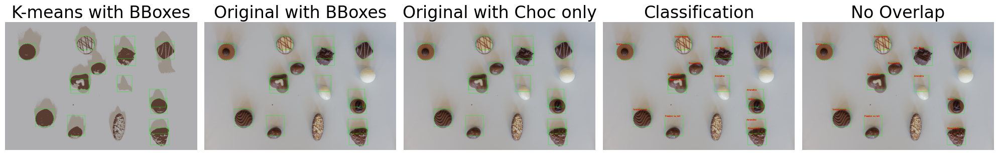

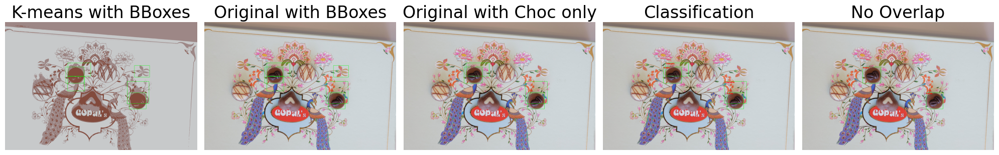

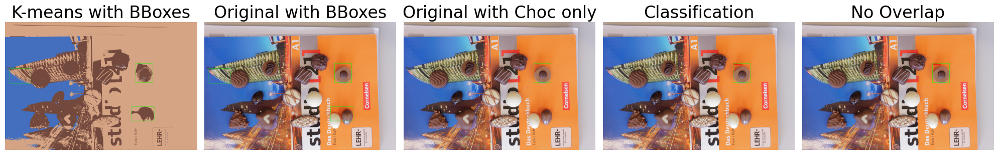

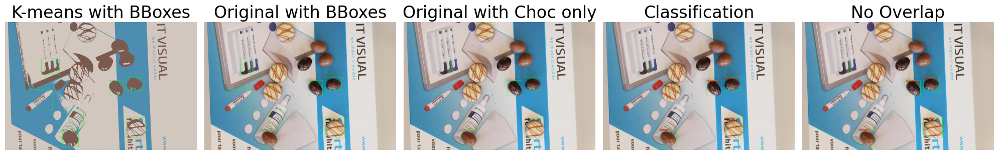

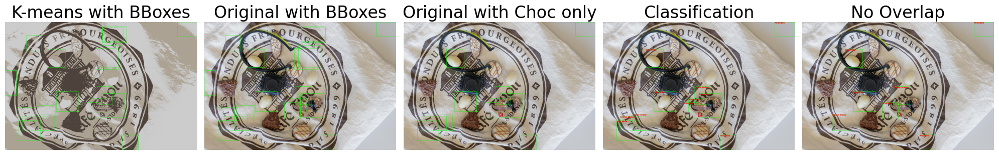

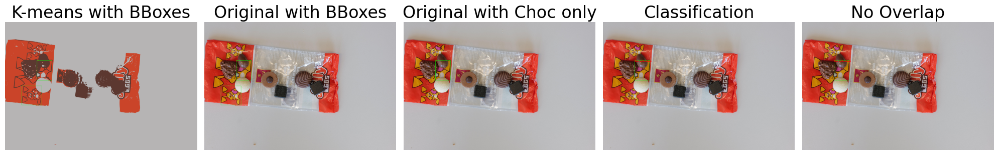

In [ ]:
for img_path in glob(os.path.join(visualize_img, "*.jpg")):
    process_image(img_path, ref_histograms, obj_histograms, 3, visualize=True)

There are several bouding boxes that are overlapping. We need to remove the duplicates. For this we will look at the certainity with which the bounding box was assigned to its corresponding label. For bounding boxes ovelapping more than 10% of their area, we will keep the one with the highest certainity.

In [ ]:
# Expected labels (MUST match what your `load_reference_histograms` returns!)
EXPECTED_LABELS = [
    "Jelly White", "Jelly Milk", "Jelly Black", "Amandina", "Creme brulee",
    "Triangolo", "Tentation noir", "Comtesse", "Noblesse", "Noir authentique",
    "Passion au lait", "Arabia", "Stracciatella"
]

In [ ]:
def process_image_for_counts(img_path, reference_histograms, reference_histograms_objects):
    # Run the full processing pipeline
    _, choc_labels = process_image(img_path, reference_histograms, reference_histograms_objects, k=4, overlap=True)

    # Count chocolate labels
    counts = {label: 0 for label in EXPECTED_LABELS}
    for label in choc_labels:
        if label in counts:
            counts[label] += 1

    return counts


In [ ]:
def generate_csv(test_folder, reference_histograms, reference_histograms_objects, output_csv):
    LABEL_NAME_MAPPING = {
        "Creme brulee": "Crème brulée"
    }

    # Update header with display labels
    header_labels = [LABEL_NAME_MAPPING.get(label, label) for label in EXPECTED_LABELS]

    with open(output_csv, mode='w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        writer.writerow(['id'] + header_labels)

        for img_path in glob(os.path.join(test_folder, '*.jpg')):
            filename = os.path.basename(img_path)

            # Extract image ID
            if filename.lower().startswith('l') and filename.lower().endswith('.jpg'):
                img_id = filename[1:filename.lower().rindex('.')]
            else:
                print(f"Unexpected filename format: {filename}")
                continue

            counts = process_image_for_counts(img_path, reference_histograms, reference_histograms_objects)

            if counts is not None:
                row = [img_id] + [counts[label] for label in EXPECTED_LABELS]
                writer.writerow(row)
                print(f"Processed: {img_id}")
    print(f"CSV file generated: {output_csv}")


In [ ]:
# test_images = os.path.abspath(os.path.join('..', 'images', 'test_small'))
test_images = os.path.abspath(os.path.join('..', 'images', 'test'))
output_csv = os.path.abspath(os.path.join('chocolate_counts.csv'))
generate_csv(
    test_images,
    ref_histograms,
    obj_histograms,
    output_csv
)


Processed: 1000757
Processed: 1000758
Processed: 1000759
Processed: 1000760
Processed: 1000761
Processed: 1000762
Processed: 1000764
Processed: 1000766
Processed: 1000767
Processed: 1000769
Processed: 1000770
Processed: 1000773
Processed: 1000774
Processed: 1000775
Processed: 1000776
Processed: 1000777
Processed: 1000778
Processed: 1000781
Processed: 1000782
Processed: 1000783
Processed: 1000784
Processed: 1000786
Processed: 1000789
Processed: 1000790
Processed: 1000794
Processed: 1000795
Processed: 1000796
Processed: 1000798
Processed: 1000800
Processed: 1000801
Processed: 1000806
Processed: 1000807
Processed: 1000809
Processed: 1000811
Processed: 1000813
Processed: 1000814
Processed: 1000816
Processed: 1000818
Processed: 1000819
Processed: 1000822
Processed: 1000823
Processed: 1000824
Processed: 1000825
Processed: 1000829
Processed: 1000830
Processed: 1000832
Processed: 1000833
Processed: 1000834
Processed: 1000835
Processed: 1000837
Processed: 1000839
Processed: 1000840
Processed: 1

In [ ]:
# test_images = os.path.abspath(os.path.join('..', 'images', 'test_small'))
test_images = os.path.abspath(os.path.join('..', 'images', 'test'))
output_csv = os.path.abspath(os.path.join('chocolate_counts.csv'))
generate_csv(
    test_images,
    ref_histograms,
    obj_histograms,
    output_csv
)


Adaptive k detection:

In [12]:
def choose_k_by_brightness(image, threshold=200):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mean_luminosity = np.mean(gray)
    return 2 if mean_luminosity > threshold else 4, mean_luminosity


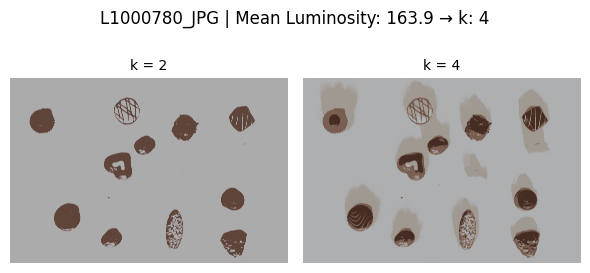

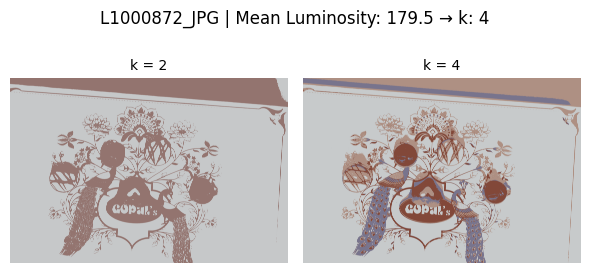

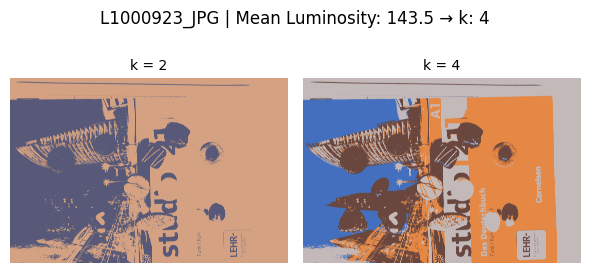

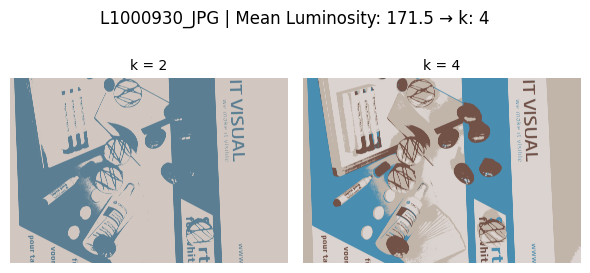

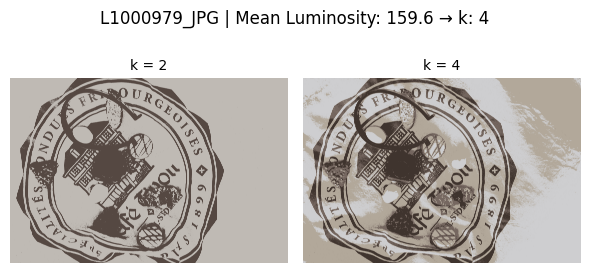

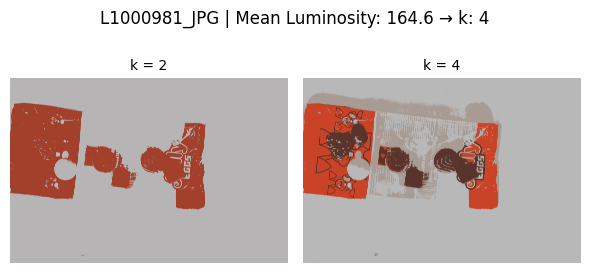

In [13]:
from visualizations import display_kmeans_comparisons_dynamic
display_kmeans_comparisons_dynamic(kmeans_clustering, choose_k_by_brightness, visualize_img)

In [14]:
def hue_vibrancy_score(hue):
    # Strongest vibrancy for red/yellow/orange/magenta
    if hue < 15 or hue > 160:
        return 1.0   # Red/Pink
    elif 15 <= hue <= 35:
        return 0.9   # Orange-Yellow
    elif 35 < hue <= 80:
        return 0.6   # Green
    elif 80 < hue <= 130:
        return 0.4   # Cyan-blue
    elif 130 < hue <= 160:
        return 0.5   # Purple
    else:
        return 0.2   # Default fallback


In [23]:
def choose_k_by_colorfulness(image, cluster_check_k=4, threshold=0.15):
    small = cv2.resize(image, (100, 100))
    Z = small.reshape((-1, 3))
    Z = np.float32(Z)
    kmeans = KMeans(n_clusters=cluster_check_k, random_state=0).fit(Z)
    labels = kmeans.labels_
    centers = np.uint8(kmeans.cluster_centers_)

    hsv_centers = cv2.cvtColor(centers[np.newaxis, :, :], cv2.COLOR_BGR2HSV)[0]

    total_pixels = labels.shape[0]
    weighted_vibrancy = 0.0

    for idx, (h, s, v) in enumerate(hsv_centers):
        if s > 50:
            area_fraction = np.sum(labels == idx) / total_pixels
            vibrancy_score = hue_vibrancy_score(h)
            weighted_vibrancy += area_fraction * vibrancy_score

    chosen_k = 4 if weighted_vibrancy > threshold else 2
    return chosen_k, weighted_vibrancy


In [ ]:
from visualizations import display_kmeans_comparisons_color
display_kmeans_comparisons_color(visualize_img, choose_k_by_colorfulness, kmeans_clustering)

In [ ]:
def choose_k_by_background_whiteness(image, whiteness_threshold=0.6):
    # Resize for speed
    small = cv2.resize(image, (100, 100))
    # Convert to grayscale
    gray = cv2.cvtColor(small, cv2.COLOR_BGR2GRAY)
    # Normalize to [0,1]
    norm_gray = gray / 255.0
    # Calculate fraction of pixels above brightness threshold (close to white)
    white_fraction = (norm_gray > whiteness_threshold).mean()
    
    chosen_k = 2 if white_fraction > 0.90 else 4  # if >90% white pixels, choose 2 else 4
    return chosen_k, white_fraction



In [33]:
def display_kmeans_by_whiteness(input_folder, choose_k_by_background_whiteness, kmeans_clustering):
    image_paths = glob(os.path.join(input_folder, "*.jpg"))

    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not read {img_path}")
            continue
        
        chosen_k, whiteness_score = choose_k_by_background_whiteness(img)
        clustered_img, _ = kmeans_clustering(img, chosen_k)
        
        # Clean filename for display (remove hash parts etc.)
        base_name = os.path.basename(img_path)
        clean_name = base_name.split(".rf")[0]

        fig, axs = plt.subplots(1, 2, figsize=(6, 3))
        fig.suptitle(
            f"{clean_name} | Whiteness Fraction: {whiteness_score:.3f} → k: {chosen_k}",
            fontsize=12
        )

        axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[0].set_title("Original", fontsize=10)
        axs[0].axis('off')

        axs[1].imshow(cv2.cvtColor(clustered_img, cv2.COLOR_BGR2RGB))
        axs[1].set_title(f"k-means (k={chosen_k})", fontsize=10)
        axs[1].axis('off')

        plt.tight_layout()
        plt.show()


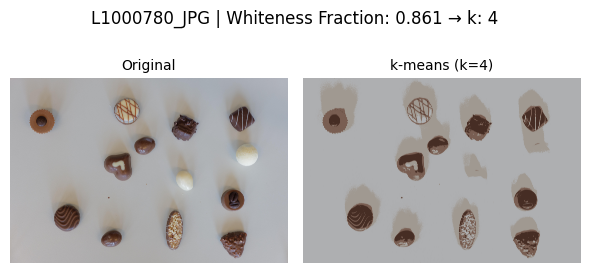

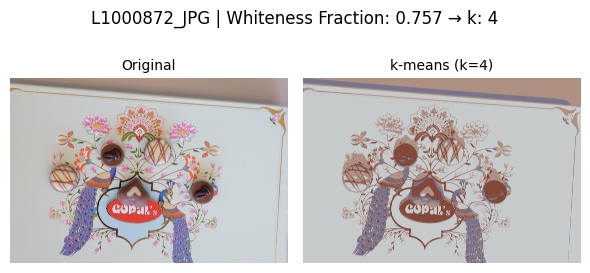

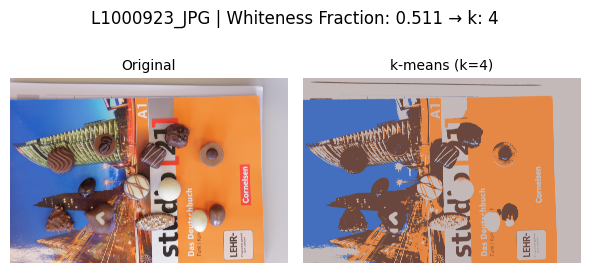

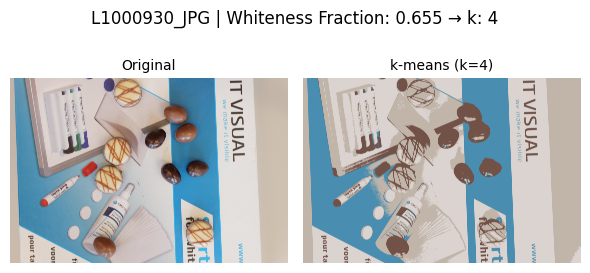

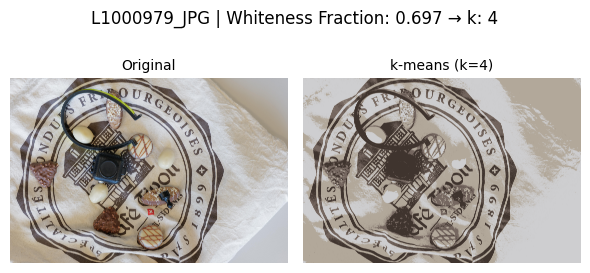

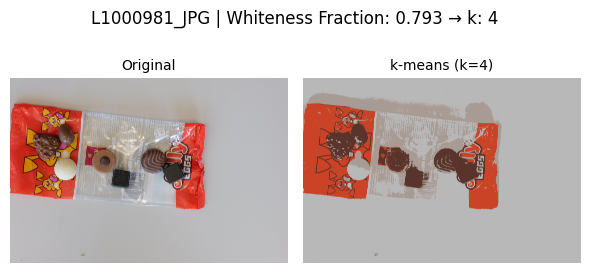

In [44]:
train_img = os.path.abspath(os.path.join('..', 'images', 'valid'))
# display_kmeans_by_whiteness(train_img, choose_k_by_background_whiteness, kmeans_clustering)
display_kmeans_by_whiteness(visualize_img, choose_k_by_background_whiteness, kmeans_clustering)

In [60]:
def choose_k_by_variation(image, threshold=50.0):
    """
    Chooses k=2 for low-variation (likely white background) and k=4 otherwise.
    """
    print("in choose")
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    var_laplacian = cv2.Laplacian(gray, cv2.CV_64F).var()

    chosen_k = 2 if var_laplacian < threshold else 4
    return chosen_k, var_laplacian


In [61]:
def display_kmeans_by_variation(input_folder, choose_k_by_variation, kmeans_clustering):
    image_paths = glob(os.path.join(input_folder, "*.jpg"))

    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not read {img_path}")
            continue
        
        chosen_k, texture_score = choose_k_by_variation(img)
        clustered_img, _ = kmeans_clustering(img, chosen_k)

        base_name = os.path.basename(img_path)
        clean_name = base_name.split(".rf")[0]

        fig, axs = plt.subplots(1, 2, figsize=(6, 3))
        fig.suptitle(
            f"{clean_name} | Texture Score: {texture_score:.2f} → k: {chosen_k}",
            fontsize=12
        )

        axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[0].set_title("Original", fontsize=10)
        axs[0].axis('off')

        axs[1].imshow(cv2.cvtColor(clustered_img, cv2.COLOR_BGR2RGB))
        axs[1].set_title(f"k-means (k={chosen_k})", fontsize=10)
        axs[1].axis('off')

        plt.tight_layout()
        plt.show()


in choose


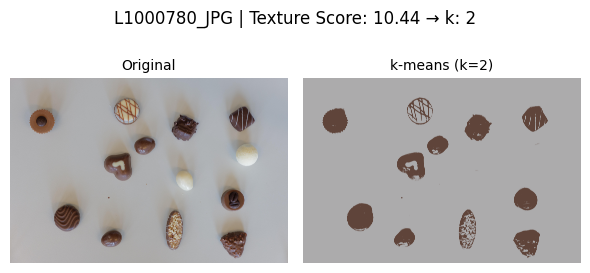

in choose


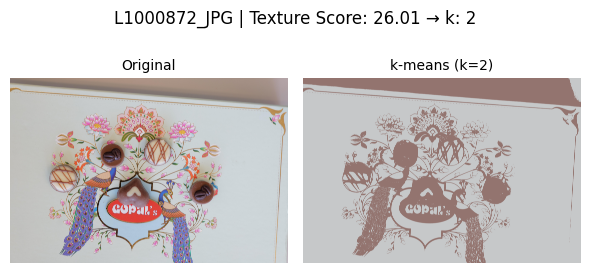

in choose


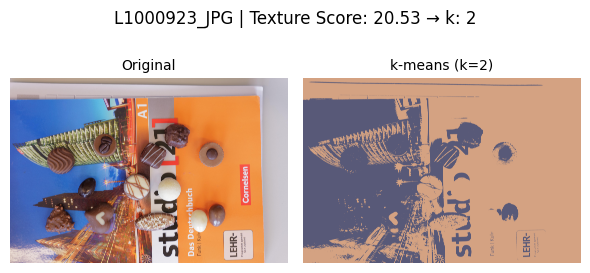

in choose


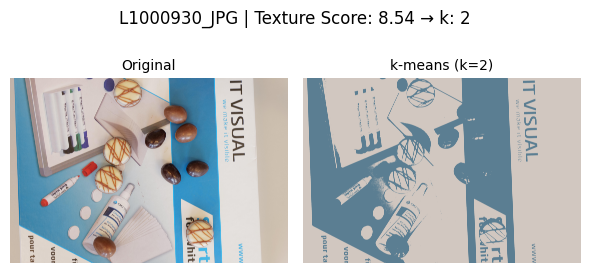

in choose


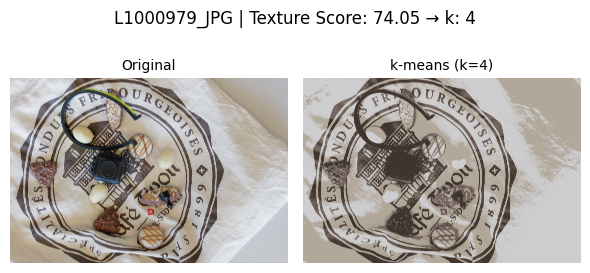

in choose


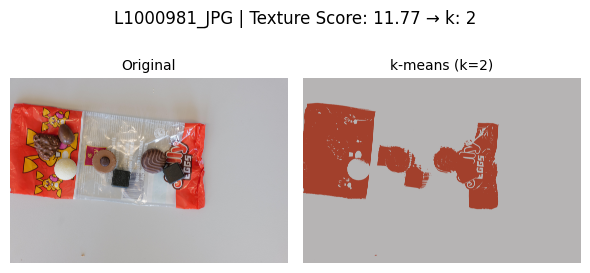

In [62]:
train_img = os.path.abspath(os.path.join('..', 'images', 'valid'))
# display_kmeans_by_variation(train_img, choose_k_by_variation, kmeans_clustering)
display_kmeans_by_variation(visualize_img, choose_k_by_variation, kmeans_clustering)

In [7]:
def choose_k_by_variation_and_whiteness(image, var_thresh=14.0, white_thresh=0.6):
    # --- Variation (Laplacian) ---
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    var_laplacian = cv2.Laplacian(gray, cv2.CV_64F).var()

    # --- Whiteness ---
    small = cv2.resize(image, (100, 100))
    small_gray = cv2.cvtColor(small, cv2.COLOR_BGR2GRAY)
    norm_gray = small_gray / 255.0
    white_fraction = (norm_gray > white_thresh).mean()

    # --- Decision ---
    if var_laplacian < var_thresh and white_fraction > 0.8:
        chosen_k = 3
    else:
        chosen_k = 4

    return chosen_k, (var_laplacian, white_fraction)


In [8]:
def display_kmeans_by_variation_and_whiteness(input_folder):
    image_paths = glob(os.path.join(input_folder, "*.jpg"))

    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not read {img_path}")
            continue

        chosen_k, (texture_score, white_frac) = choose_k_by_variation_and_whiteness(img)

        clustered_k3, _ = kmeans_clustering(img, 3)
        clustered_k4, _ = kmeans_clustering(img, 4)

        base_name = os.path.basename(img_path)
        clean_name = base_name.split(".rf")[0]  # Clean display name

        fig, axs = plt.subplots(1, 3, figsize=(9, 3))
        fig.suptitle(
            f"{clean_name} | Var: {texture_score:.1f}, White: {white_frac:.2f} → Chosen k={chosen_k}",
            fontsize=11
        )

        axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[0].set_title("Original", fontsize=9)
        axs[0].axis('off')

        axs[1].imshow(cv2.cvtColor(clustered_k3, cv2.COLOR_BGR2RGB))
        axs[1].set_title("k = 3", fontsize=9)
        axs[1].axis('off')

        axs[2].imshow(cv2.cvtColor(clustered_k4, cv2.COLOR_BGR2RGB))
        axs[2].set_title("k = 4", fontsize=9)
        axs[2].axis('off')

        plt.tight_layout()
        plt.show()


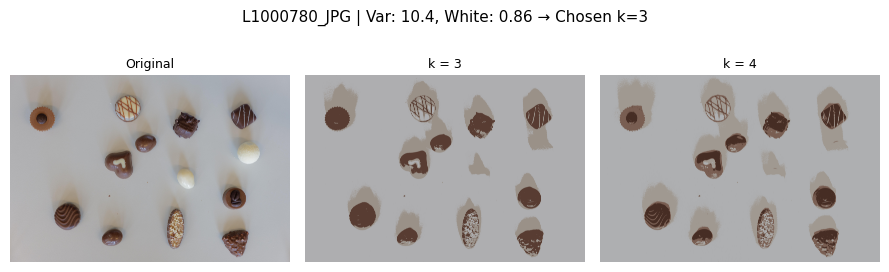

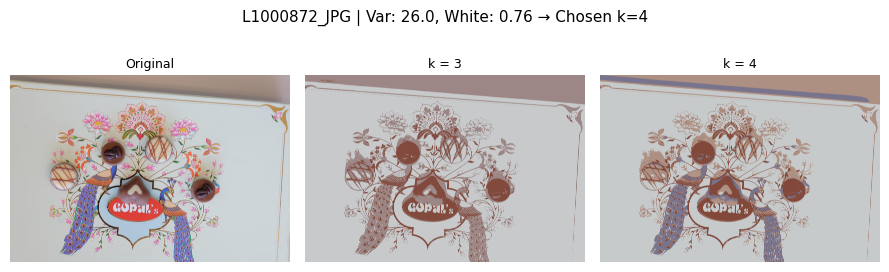

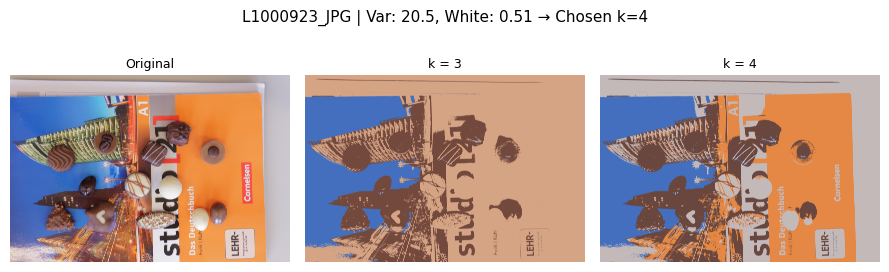

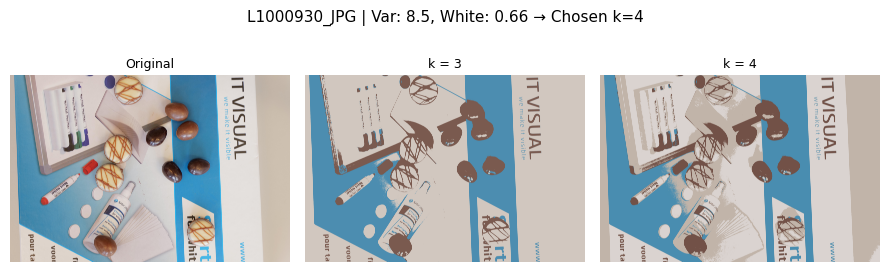

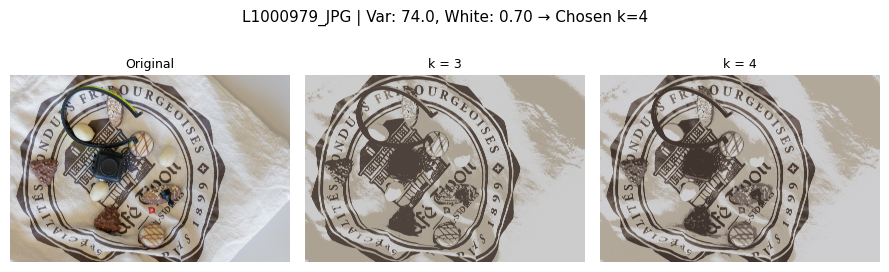

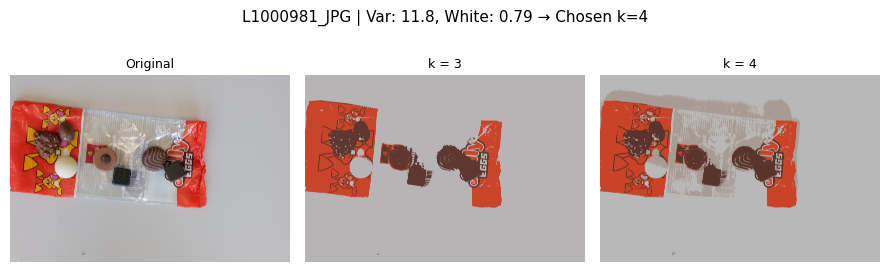

In [11]:
train_img = os.path.abspath(os.path.join('..', 'images', 'valid'))
display_kmeans_by_variation_and_whiteness(visualize_img)
# display_kmeans_by_variation_and_whiteness(train_img)

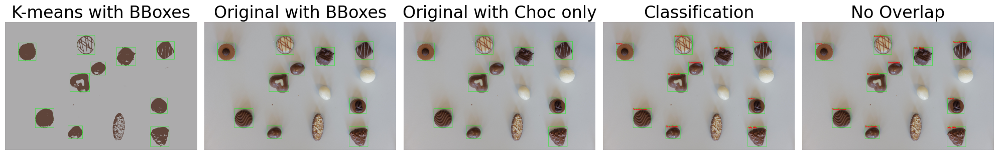

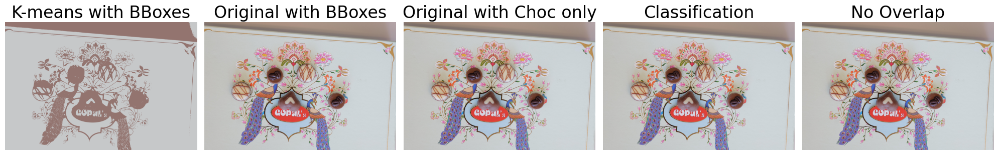

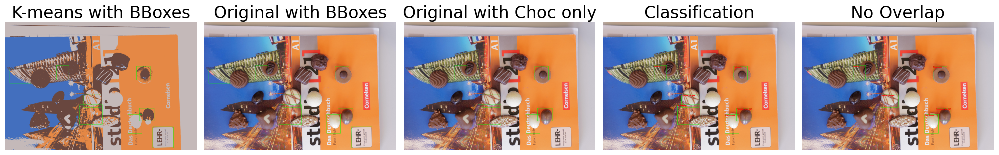

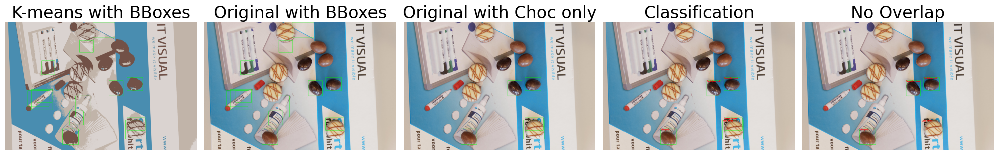

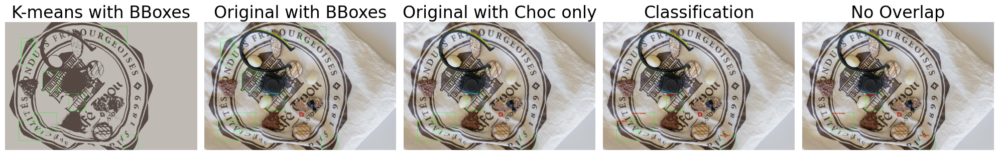

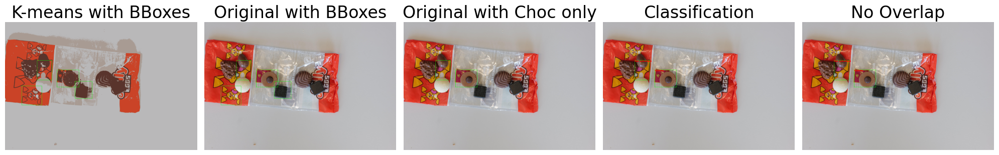

In [17]:
for img_path in glob(os.path.join(visualize_img, "*.jpg")):
    img = cv2.imread(img_path)

    adaptive_k, _ = choose_k_by_colorfulness(img)
    process_image(img_path, ref_histograms, obj_histograms, k=adaptive_k, visualize=True)



In [ ]:
output_csv = os.path.abspath(os.path.join('chocolate_counts.csv'))
generate_csv(
    test_images,
    ref_histograms,
    obj_histograms,
    output_csv
)